In [3]:
%pip install opencv-python

In [1]:
import numpy as np
import math
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import h5py

In [2]:
path = 'D:/FastFoodRecognition/'

In [3]:
# Load training and testing data
file = h5py.File(path + 'fastfoodrbg.h5', 'r+')
file1 = h5py.File(path + 'fastfoodlabel.h5', 'r+')

In [4]:
data = np.array(file["data"]).astype("uint8")
label = np.array(file1["label"]).astype("uint8")

In [5]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(data, label, test_size=0.4, random_state=42)

In [6]:
def image_grid(D,H,W,R,cols=10,scale=1):
    """ display a grid of images
        H,W: Height and width of the images
        cols: number of columns = number of images in each row
        scale: 1 to fill screen
    """
    n = np.shape(D)[0]
    rows = int(math.ceil((n+0.0)/cols))
    fig = plt.figure(1,figsize=[scale*20.0/H*W,scale*20.0/cols*rows],dpi=300)
    for i in range(n):
        plt.subplot(rows,cols,i+1)
        fig=plt.imshow(np.reshape(D[i,:],[H,W,R]), cmap = plt.get_cmap("viridis"))
        plt.axis('off')

In [7]:
H = 200
W = 200
R = 3

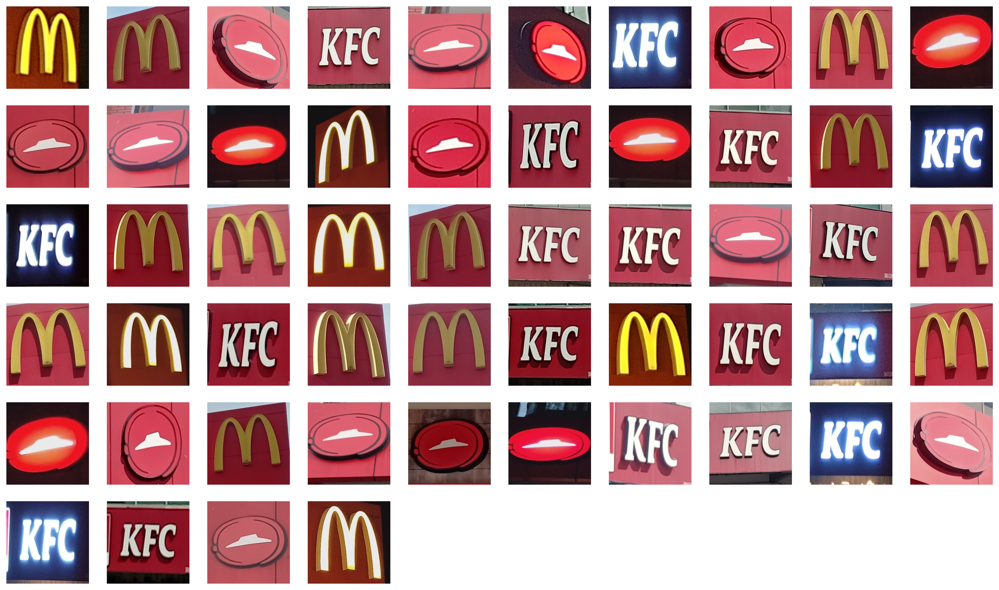

In [8]:
# Visualize the training images
image_grid(X_train, H, W, R)
plt.show()

In [9]:
# Find the mean image
mean_image = np.mean(X_train, axis=0)

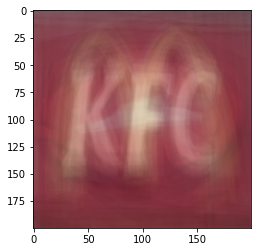

In [10]:
plt.imshow(np.reshape(mean_image.astype('uint8'), [H, W, R]), cmap=plt.get_cmap("viridis"))
plt.show()

**LDA**

In [11]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
lda = LinearDiscriminantAnalysis(n_components = 2)

In [12]:
lda.fit(X_train, y_train)
X_train_lda = lda.transform(X_train)
X_test_lda = lda.transform(X_test)

In [13]:
print("Shape of training data : {}".format(X_train_lda.shape))
print("Shape of testing data : {}".format(X_test_lda.shape))

Shape of training data : (54, 2)
Shape of testing data : (36, 2)


In [14]:
# Calculate distances

intra_class_dist = np.sum(np.power((X_train_lda[1,:] - X_test_lda[1,:]),2))
inter_class_dist = np.sum(np.power((X_train_lda[1,:] - X_test_lda[6,:]),2))
print("Intra-class distance: %d" % (intra_class_dist))
print("Inter-class distance: %d" % (inter_class_dist))

Intra-class distance: 48
Inter-class distance: 1


**K-NN**

In [56]:
# loading library
from sklearn.neighbors import KNeighborsClassifier
# instantiate learning model (k = 3)
knn = KNeighborsClassifier(n_neighbors=3)

In [57]:
# fitting the model
knn.fit(X_train_lda, y_train)

KNeighborsClassifier(n_neighbors=3)

In [61]:
# predict the response
y_pred = knn.predict(X_test_lda)
print("Test set predictions:\n {}".format(y_pred))
y_predtrain = knn.predict(X_train_lda)
print("Train set predictions:\n {}".format(y_predtrain))

Test set predictions:
 [2 1 2 3 1 1 2 3 1 2 3 2 2 3 1 1 1 1 2 3 1 3 3 2 2 1 3 3 2 3 1 2 1 2 2 1]
Train set predictions:
 [2 2 1 3 1 1 3 1 2 1 1 1 1 2 1 3 1 3 2 3 3 2 2 2 2 3 3 1 3 2 2 2 3 2 1 3 2
 3 3 2 1 1 2 1 1 1 3 3 3 1 3 3 1 2]


In [62]:
print("Train set score: {:.2f}".format(knn.score(X_train_lda, y_train)))
print("Test set score: {:.2f}".format(knn.score(X_test_lda, y_test)))

Train set score: 0.98
Test set score: 0.94


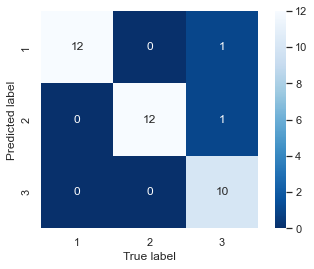

In [63]:
import seaborn as sns; sns.set()  # for plot styling
from sklearn.metrics import confusion_matrix

mat = confusion_matrix(y_test, y_pred)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cmap='Blues_r',
            xticklabels=knn.classes_,
            yticklabels=knn.classes_)
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.show()

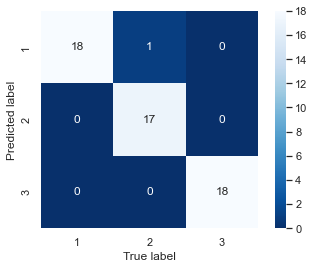

In [64]:
import seaborn as sns; sns.set()  # for plot styling
from sklearn.metrics import confusion_matrix

mat = confusion_matrix(y_train, y_predtrain)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cmap='Blues_r',
            xticklabels=knn.classes_,
            yticklabels=knn.classes_)
plt.xlabel('True label')
plt.ylabel('Predicted label')
plt.show()

In [65]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.92      1.00      0.96        12
           2       0.92      1.00      0.96        12
           3       1.00      0.83      0.91        12

    accuracy                           0.94        36
   macro avg       0.95      0.94      0.94        36
weighted avg       0.95      0.94      0.94        36



**Use trained model to predict img**

Test result is:  McD


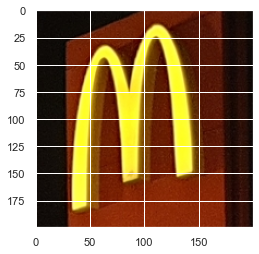

In [66]:
img = path+'Data/mcd/2_5.jpg'
img = cv2.imread(os.path.join(img))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
img = np.asarray(img)
img = img.reshape(1,-1)
img = lda.transform(img)
test_result = knn.predict(img)

if test_result == 1:
  output = 'PizzaHut'
elif test_result == 2:
  output = 'McD'
else:
  output = 'KFC'

print('Test result is: ',output)


**Use Tkinter to create Interface**

In [38]:
from tkinter import *
from PIL import ImageTk, Image
from tkinter import filedialog


def check(img):
    img = cv2.imread(os.fspath(img))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img = np.asarray(img)
    img = img.reshape(1,-1)
    img = lda.transform(img)
    test_result = knn.predict(img)

    if test_result == 1:
        output = 'PizzaHut'
    elif test_result == 2:
        output = 'McD'
    else:
        output = 'KFC'
    print(output)

def uploadImage():
    file_path = filedialog.askopenfile(mode ='r', filetypes =[('Image Files', '*.jpg'), ('Image Files', '*.png')]) 
    if file_path is not None:
        check(file_path.name)

def mainScreen():
    
    global main
    main = Tk()
    main.title("Fast Food Recognition System")
    main.geometry("500x400")
    main.configure(background="#f7f5dd")
    
    Label(main, text="Welcome", font="Courier 20 bold", background="#f7f5dd", fg='#4f6346').place(x=190,y=20)
    Button(main, text = 'Choose Image !', command=uploadImage).place(x=190,y=200)

    mainloop()
mainScreen()

McD
McD
McD
